<h1>Spectral Analysis on Backward Pass</h1>

In this notebook, we are looking at whether or not the forward pass of flow models is autoregressive. For all models we are assuming:

\begin{align}
x_0 &\sim \mathcal{N}(0, 1) \\

x_1 &\sim \text{CIFAR-10}
\end{align}

We then want to move from $x_0$ to $x_1$ using our pre-trained models.

## Imports

In [1]:
# Inspired from https://github.com/w86763777/pytorch-ddpm/tree/master.

# Authors: Kilian Fatras
#          Alexander Tong

from matplotlib import rc
rc('animation', html='jshtml')
import matplotlib.pyplot as plt
from matplotlib import animation

import copy
import numpy as np
import torch
from torchdyn.core import NeuralODE
from torchvision.utils import save_image

from torchcfm.models.unet.unet import UNetModelWrapper
from pathlib import Path
import os

## Load the model (U-Net)

In [15]:
device = "cpu"
FM_NAME = "otcfm"

ROOT = Path.cwd().parent.parent.parent

if FM_NAME not in [f.name for f in os.scandir(ROOT / "results") if f.is_dir()]:
    raise ValueError(f"{FM_NAME} is not a trained model. FM_NAME must be one of {[f.name for f in os.scandir(ROOT / 'results') if f.is_dir()]}")

In [16]:
NUM_CHANNEL = 128

net_model = UNetModelWrapper(
    dim=(3, 32, 32),
    num_res_blocks=2,
    num_channels=NUM_CHANNEL,
    channel_mult=[1, 2, 2, 2],
    num_heads=4,
    num_head_channels=64,
    attention_resolutions="16",
    dropout=0.1,
)

ema_model = copy.deepcopy(net_model)

In [17]:
CHECKPOINT_PATH = ROOT / "results" / FM_NAME / f"{FM_NAME}_cifar10_weights_step_400000.pt"
IMAGE_PATH = ROOT / "assets" / FM_NAME / "images" / "backward"
os.makedirs(IMAGE_PATH, exist_ok=True)

checkpoint = torch.load(CHECKPOINT_PATH, map_location=device)

In [18]:
# net_model.load_state_dict(checkpoint["net_model"])
ema_model.load_state_dict(checkpoint["ema_model"])

<All keys matched successfully>

The net model corresponds to the model trained with normal backprop, that is updating the weights w.r.t. the gradient and learning rate. The EMA model utilises a trick from the [Adam paper](https://arxiv.org/abs/1412.6980) in section 7.2. We update the weights using an **E**xponential **M**oving **A**verage.

## Generate images

### Calculate trajectories

In [19]:
num_rows = 2 # num images will be num_rows ** 2

def get_traj(model_, device = device):
    node_ = NeuralODE(
        model_, 
        solver="euler", 
        sensitivity="adjoint", 
        return_t_eval=False,
    ).to(device)
    with torch.no_grad():
        traj = node_(
            torch.randn(num_rows ** 2, 3, 32, 32, device=device),
            t_span=torch.linspace(0, 1, 100, device=device),
        )
    return traj

def plot_images(traj):
    traj = traj[-1, :].view([-1, 3, 32, 32]).clip(-1, 1)
    traj = traj / 2 + 0.5
    save_image(traj, "sample.png", nrow=num_rows)

In [8]:
traj = get_traj(ema_model, device)

In [ ]:
traj = traj.cpu().numpy()
np.save(IMAGE_PATH / "backward.npy", traj)

### Checkpoint (for loading saved trajectory)

In [46]:
traj = torch.tensor(np.load(IMAGE_PATH / "backward.npy")).to(device)
print(f"Loading trajectory from {IMAGE_PATH / 'backward.npy'}")

Loading trajectory from /Users/oskarjor/conditional-flow-matching/assets/otcfm/images/backward/backward.npy


We generate a gif of how the model moves noise to realistic images (every frame is a time step)

In [ ]:
num_images = traj.shape[1]

rows = np.ceil(np.sqrt(num_images)).astype(int)
cols = np.ceil(num_images / rows).astype(int)

rows = 1
cols = 4

fig, axs = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))

artists = []

# duplicate the first trajctory 10 times and prepend it to the original trajectory
traj = torch.cat([traj[0].unsqueeze(0).repeat(5, 1, 1, 1, 1), traj], dim=0)

# do the same for the last trajectory
# traj = torch.cat([traj, traj[-1].unsqueeze(0).repeat(15, 1, 1, 1, 1)], dim=0)


for i in range(traj.shape[0]):
    traj_ = traj[i, :].view([-1, 3, 32, 32]).clip(-1, 1)
    traj_ = traj_ / 2 + 0.5
    traj_ = traj_.cpu().detach().numpy()
    container = []
    for j in range(traj_.shape[0]):
        ax = axs[j // cols, j % cols]
        ax.axis("off")
        container += [ax.imshow(traj_[j].transpose(1, 2, 0))]
    artists.append(container)

plt.close()

ani = animation.ArtistAnimation(fig, artists, interval=100, blit=True, repeat=False)
ani

In [45]:
ani.save(IMAGE_PATH / "sample_4_horizontal.gif", writer="imagemagick", fps=10)

MovieWriter imagemagick unavailable; using Pillow instead.


## Calculate Radially Averaged Power Spectrum Density (RAPSD)

In [48]:
import pysteps.utils.spectral as spectral

def calc_mean_log_rapsd(x, num_examples):
  spectra = []
  for k in range(num_examples):
    rapsd, frequencies = spectral.rapsd(x[k, ...], fft_method=np.fft, return_freq=True)
    spectra.append(rapsd)

  mean_log_rapsd = np.mean(np.array([np.log(s + 1e-30) for s in spectra]), axis=0)
  return mean_log_rapsd, frequencies

Pysteps configuration file found at: /Users/oskarjor/miniconda3/envs/torchcfm/lib/python3.10/site-packages/pysteps/pystepsrc



In [ ]:
traj = traj.cpu().detach().numpy()
traj = traj.transpose(0, 1, 3, 4, 2)

total_time_steps = traj.shape[0]
num_examples = traj.shape[1]

images = traj[-1]
print(images.shape)
mean_log_rapsd, frequencies = calc_mean_log_rapsd(images[..., 1], num_examples)

### Verify autoregressive property of the trained model (diffusion backward pass)

#### Generate a gif

In [11]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5), width_ratios=[2, 1])

ax1.plot(frequencies[1:], np.exp(mean_log_rapsd)[1:], c='red', marker='o', markersize=3, label='images')
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.set_xlabel('frequency')
ax1.set_ylabel('power')
ax2.axis('off')

num_steps = total_time_steps
cycles_per_sec = 0.2
selected_image_idx = 0

noise_scale_min, noise_scale_max = 0.02, 50.0
noise_scales = np.logspace(np.log10(noise_scale_min), np.log10(noise_scale_max), num_steps)

artists = []
for i in range(num_steps):
  if i == num_steps - 2:
    break
  noisy_images = traj[i]
  noise = images - noisy_images
  mean_log_rapsd_sum, _ = calc_mean_log_rapsd(noisy_images[..., 1], num_examples=num_examples)
  mean_log_rapsd_sum_noise, _ = calc_mean_log_rapsd(noise[..., 1], num_examples=num_examples)
  container = ax1.plot(frequencies[1:], np.exp(mean_log_rapsd_sum)[1:], c='green', marker='o', markersize=3, label='noisy images')
  container += ax1.plot(frequencies[1:], np.exp(mean_log_rapsd_sum_noise)[1:], c='blue', marker='o', markersize=3, label='noise')


  container += [ax2.imshow(np.clip((noisy_images[selected_image_idx] + 1) / 2, 0, 1))]

  artists.append(container)

plt.close()  # Avoid showing static plot, we only want to see the animation.

anim = animation.ArtistAnimation(fig=fig, artists=artists, interval=1000 / (num_steps * cycles_per_sec))
anim

Save the gif

In [12]:
anim.save(IMAGE_PATH / f"noise_to_image_{num_images}_spectral.gif", writer="imagemagick", fps=10)

MovieWriter imagemagick unavailable; using Pillow instead.


#### Generate images (for paper)

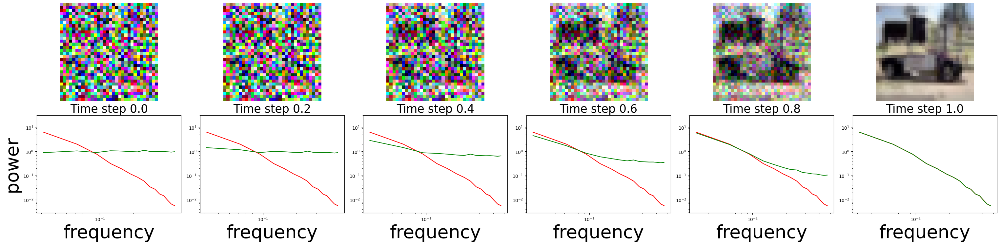

In [13]:
# TODO: make sure to include t=0 and t=1 in the animation

width = 6
fig, ax = plt.subplots(2, width, figsize=(5 * width, 7))
fig.tight_layout()

num_steps = width
cycles_per_sec = 0.2
selected_image_idx = 2

noise_scale_min, noise_scale_max = 0.02, 50.0

idxs = np.linspace(0, total_time_steps-1, num_steps).astype(int)

lower_lim, upper_lim = np.exp(mean_log_rapsd[1:]).min(), np.exp(mean_log_rapsd[1:]).max()
lower_lim, upper_lim = lower_lim * 0.5, upper_lim * 5

for i in range(num_steps):
  idx = idxs[i]
  noisy_images = traj[idx]
  noise = images - noisy_images
  # mean_log_rapsd_noise, _ = calc_mean_log_rapsd(noise[..., 1], num_examples=num_examples)
  mean_log_rapsd_sum, _ = calc_mean_log_rapsd(noisy_images[..., 1], num_examples=num_examples)
  # plot image in subplot i
  ax[0, i].imshow(np.clip((noisy_images[selected_image_idx] + 1) / 2, 0, 1))
  ax[0, i].axis('off')
  # plot rapsd in subplot i
  ax[1, i].set_title(f"Time step {((idx) / (total_time_steps-1)):.1f}", fontsize=25)
  ax[1, i].set_xscale('log')
  ax[1, i].set_yscale('log')
  ax[1, i].set_xlabel('frequency', fontsize=40)
  ax[1, i].set_ylim(lower_lim, upper_lim)
  if i == 0:
    ax[1, i].set_ylabel('power', fontsize=40)
  ax[1, i].plot(frequencies[1:], np.exp(mean_log_rapsd)[1:], c='red', label='images')
  # ax[1, i].plot(frequencies[1:], np.exp(mean_log_rapsd_noise)[1:], c='blue', label='noise')
  ax[1, i].plot(frequencies[1:], np.exp(mean_log_rapsd_sum)[1:], c='green', label='noisy images')


plt.savefig(IMAGE_PATH / "power_law.png", bbox_inches='tight')

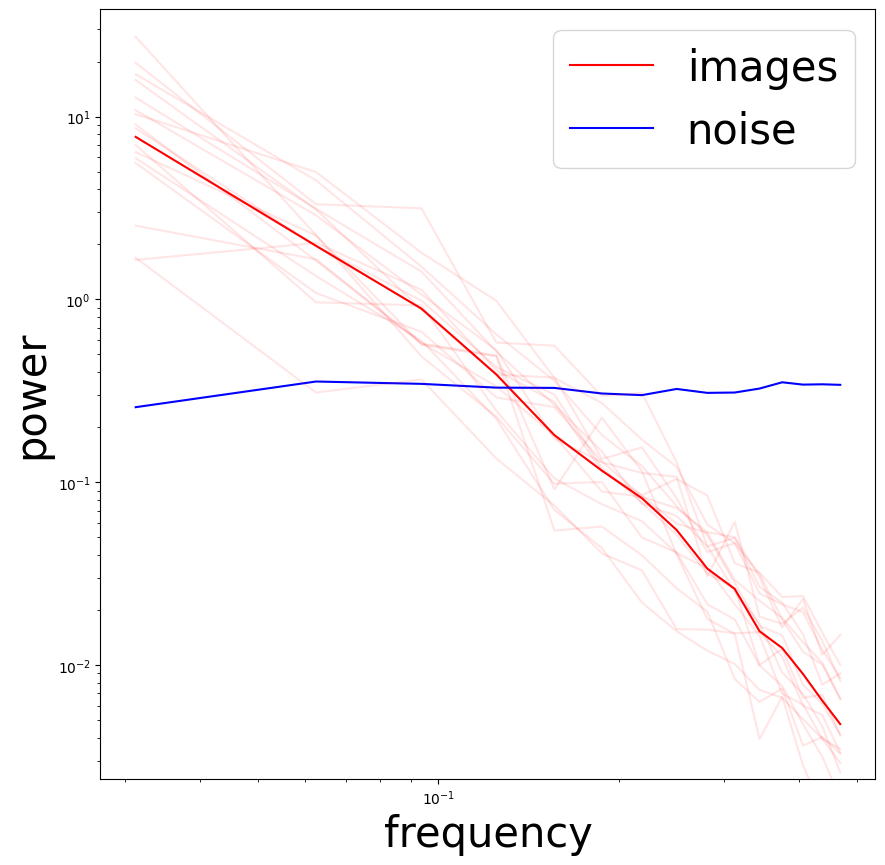

In [94]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

noise = np.random.rand(*images.shape) * 2 - 1
mean_log_rapsd_noise, _ = calc_mean_log_rapsd(noise[..., 1], num_examples=num_examples)

lower_lim, upper_lim = np.exp(mean_log_rapsd[1:]).min(), np.exp(mean_log_rapsd[1:]).max()
lower_lim, upper_lim = lower_lim * 0.5, upper_lim * 5

ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('frequency', fontsize=30)
ax.set_ylabel('power', fontsize=30)
ax.set_ylim(lower_lim, upper_lim)
ax.plot(frequencies[1:], np.exp(mean_log_rapsd)[1:], c='red', label='images')
ax.plot(frequencies[1:], np.exp(mean_log_rapsd_noise)[1:], c='blue', label='noise')
ax.legend(prop={'size': 30})
for i in range(images.shape[0]):
  mean_log_rapsd_image, _ = calc_mean_log_rapsd(images[i:i+1][..., 1], num_examples=1)
  ax.plot(frequencies[1:], np.exp(mean_log_rapsd_image)[1:], c='red', alpha=0.1)

plt.savefig(IMAGE_PATH / "power_law_noise.png", bbox_inches='tight')


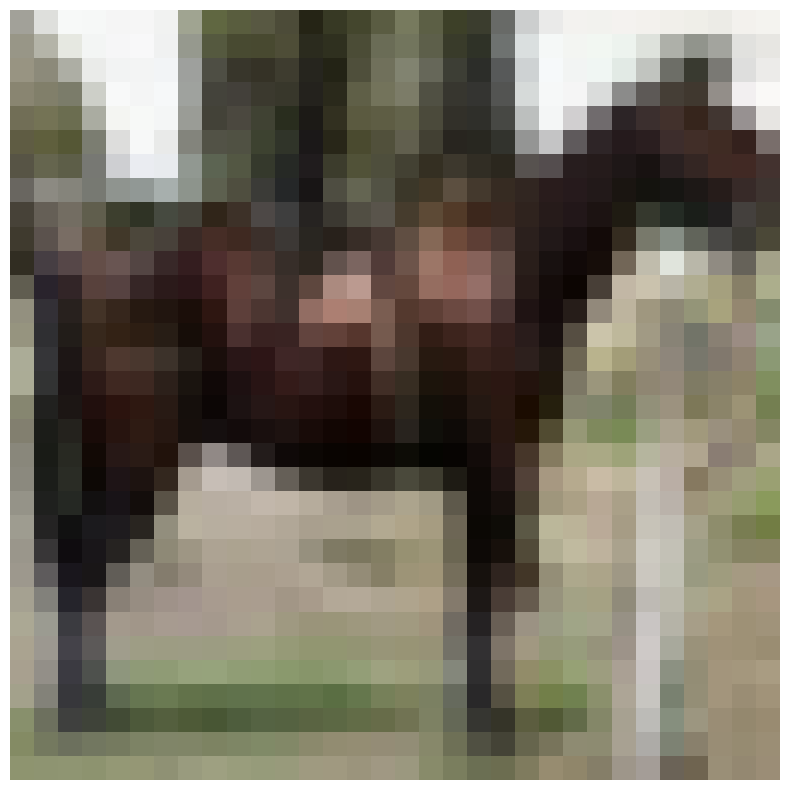

In [75]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

idx = 60
im_idx = 11

os.makedirs(IMAGE_PATH / f"image_{im_idx}", exist_ok=True)

for idx in range(100):
    ax.axis('off')
    ax.imshow(np.clip((traj[idx][im_idx] + 1) / 2, 0, 1))

    plt.savefig(IMAGE_PATH / f"image_{im_idx}" / f"t_{idx}.png", bbox_inches='tight')

## Additional toy examples

### Average power of random Gaussian

This demonstrates that that the mean power for a standard Gaussian $\mathcal{N}(0, \sigma^2)$ is $\sigma^2$ empirically. We first show that this is the case for 2D data (images) using RAPSD.

In [ ]:
sigma = 1
num_examples = 1000
dim = 128

noise = torch.normal(0, sigma, (num_examples, dim, dim)).numpy()
mean_log_rapsd_noise, frequencies = calc_mean_log_rapsd(noise, num_examples=num_examples)

print("Mean: ", np.mean(np.exp(mean_log_rapsd_noise)[1:]))
print("Sigma: ", sigma)
print("Mean / Sigma^2: ", np.mean(np.exp(mean_log_rapsd_noise)[1:]) / sigma**2)

fig, ax = plt.subplots(1, 1, figsize=(3, 3))
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('frequency')
ax.set_ylabel('power')
ax.plot(frequencies[1:], np.exp(mean_log_rapsd_noise)[1:], c='blue', label='noise')
ax.set_ylim(sigma ** 2 / 10, sigma ** 2 * 10)
plt.show()


We also demonstrate that this is the case when averaging a lot of series in 1D, when setting the frequency to 2 in the Welch's method. I am unsure what exactly this does, but this at the very least explain that the average power of a 1D Gaussian sequence sclaes with $\sigma^2$ to a constant $C$.

In [ ]:
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
import torch
# Assume 'data' is your 1D sequence and 'fs' is your sampling frequency
fs = 1000  # Example sampling frequency in Hz

total_frequencies = []
total_psd = []

sigma = 2
num_examples = 1000

for i in range(10000):
    noise = torch.normal(0, sigma, (num_examples, )).numpy()

    # Calculate the PSD using Welch's method
    frequencies, psd = signal.welch(noise, fs=2, nperseg=num_examples)  # TODO: we need to set FS to 2, why is that?

    total_frequencies.append(frequencies)
    total_psd.append(psd)

mean_freq = np.mean(total_frequencies, axis=0)
mean_psd = np.mean(total_psd, axis=0)

print("Mean: ", np.mean(mean_psd[1:]))
print("Sigma: ", sigma)
print("Sigma^2: ", sigma**2)
print("Mean / Sigma^2: ", np.mean(mean_psd[1:]) / sigma**2)

# Plot the results
plt.semilogy(mean_freq[1:], mean_psd[1:])
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.title('Power Spectral Density')
plt.ylim(sigma ** 2 / 10, sigma ** 2 * 10)
plt.show()

This is interesting, because it provides a clear connection between the PSD of our images and what the upper and lower bound of your noise schedule.